<a href="https://colab.research.google.com/github/ayushkumar122/ayushkumar122/blob/main/Credit_Card_default_Prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd
df = pd.read_csv('/content/UCI_Credit_Card.csv.zip')
df.head(5)

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


# New Section

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
df.shape

(30000, 25)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ID                          30000 non-null  int64  
 1   LIMIT_BAL                   30000 non-null  float64
 2   SEX                         30000 non-null  int64  
 3   EDUCATION                   30000 non-null  int64  
 4   MARRIAGE                    30000 non-null  int64  
 5   AGE                         30000 non-null  int64  
 6   PAY_0                       30000 non-null  int64  
 7   PAY_2                       30000 non-null  int64  
 8   PAY_3                       30000 non-null  int64  
 9   PAY_4                       30000 non-null  int64  
 10  PAY_5                       30000 non-null  int64  
 11  PAY_6                       30000 non-null  int64  
 12  BILL_AMT1                   30000 non-null  float64
 13  BILL_AMT2                   300

In [ ]:
df.nunique()

ID                            30000
LIMIT_BAL                        81
SEX                               2
EDUCATION                         7
MARRIAGE                          4
AGE                              56
PAY_0                            11
PAY_2                            11
PAY_3                            11
PAY_4                            11
PAY_5                            10
PAY_6                            10
BILL_AMT1                     22723
BILL_AMT2                     22346
BILL_AMT3                     22026
BILL_AMT4                     21548
BILL_AMT5                     21010
BILL_AMT6                     20604
PAY_AMT1                       7943
PAY_AMT2                       7899
PAY_AMT3                       7518
PAY_AMT4                       6937
PAY_AMT5                       6897
PAY_AMT6                       6939
default.payment.next.month        2
dtype: int64

In [ ]:
df.isnull().sum()

ID                            0
LIMIT_BAL                     0
SEX                           0
EDUCATION                     0
MARRIAGE                      0
AGE                           0
PAY_0                         0
PAY_2                         0
PAY_3                         0
PAY_4                         0
PAY_5                         0
PAY_6                         0
BILL_AMT1                     0
BILL_AMT2                     0
BILL_AMT3                     0
BILL_AMT4                     0
BILL_AMT5                     0
BILL_AMT6                     0
PAY_AMT1                      0
PAY_AMT2                      0
PAY_AMT3                      0
PAY_AMT4                      0
PAY_AMT5                      0
PAY_AMT6                      0
default.payment.next.month    0
dtype: int64

In [ ]:
df.describe

<bound method NDFrame.describe of           ID  LIMIT_BAL  SEX  EDUCATION  MARRIAGE  AGE  PAY_0  PAY_2  PAY_3  \
0          1    20000.0    2          2         1   24      2      2     -1   
1          2   120000.0    2          2         2   26     -1      2      0   
2          3    90000.0    2          2         2   34      0      0      0   
3          4    50000.0    2          2         1   37      0      0      0   
4          5    50000.0    1          2         1   57     -1      0     -1   
...      ...        ...  ...        ...       ...  ...    ...    ...    ...   
29995  29996   220000.0    1          3         1   39      0      0      0   
29996  29997   150000.0    1          3         2   43     -1     -1     -1   
29997  29998    30000.0    1          2         2   37      4      3      2   
29998  29999    80000.0    1          3         1   41      1     -1      0   
29999  30000    50000.0    1          2         1   46      0      0      0   

       PAY_4  ...

In [ ]:
df['default.payment.next.month'].value_counts()

0    23364
1     6636
Name: default.payment.next.month, dtype: int64

In [ ]:
df.describe()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,...,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,...,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,...,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,...,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,...,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,...,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,...,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,...,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


In [ ]:
df.dropna(inplace=True)

In [ ]:
df.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default.payment.next.month
0,1,20000.0,2,2,1,24,2,2,-1,-1,...,0.0,0.0,0.0,0.0,689.0,0.0,0.0,0.0,0.0,1
1,2,120000.0,2,2,2,26,-1,2,0,0,...,3272.0,3455.0,3261.0,0.0,1000.0,1000.0,1000.0,0.0,2000.0,1
2,3,90000.0,2,2,2,34,0,0,0,0,...,14331.0,14948.0,15549.0,1518.0,1500.0,1000.0,1000.0,1000.0,5000.0,0
3,4,50000.0,2,2,1,37,0,0,0,0,...,28314.0,28959.0,29547.0,2000.0,2019.0,1200.0,1100.0,1069.0,1000.0,0
4,5,50000.0,1,2,1,57,-1,0,-1,0,...,20940.0,19146.0,19131.0,2000.0,36681.0,10000.0,9000.0,689.0,679.0,0


{'whiskers': [<matplotlib.lines.Line2D at 0x7e7b895f00a0>,
 'caps': [<matplotlib.lines.Line2D at 0x7e7b895f0610>,
 'boxes': [<matplotlib.lines.Line2D at 0x7e7b8a32baf0>],
 'medians': [<matplotlib.lines.Line2D at 0x7e7b895f0c10>],
 'fliers': [<matplotlib.lines.Line2D at 0x7e7b895f0f10>],
 'means': []}

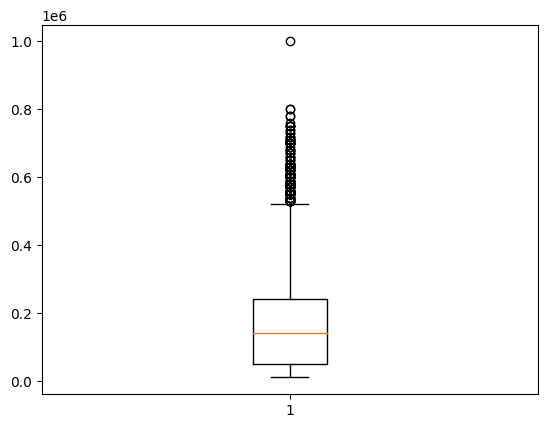

In [ ]:

import matplotlib.pyplot as plt
plt.boxplot(df['LIMIT_BAL'])

Text(0, 0.5, 'ID')

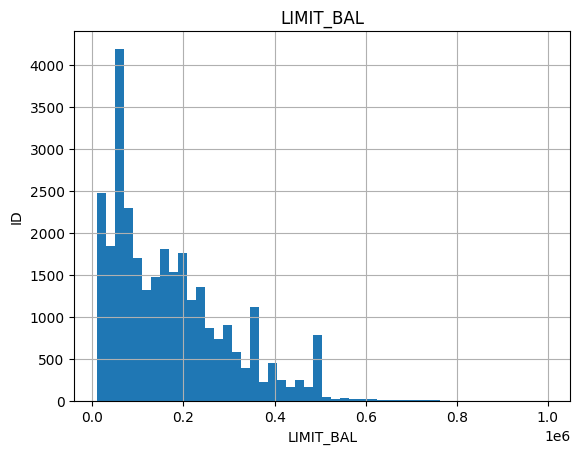

In [ ]:
figure=df['LIMIT_BAL'].hist(bins=50)
figure.set_title('LIMIT_BAL')
figure.set_xlabel('LIMIT_BAL')
figure.set_ylabel('ID')

In [ ]:
# Handling outliers
Q1=df['LIMIT_BAL'].quantile(0.25)
Q3=df['LIMIT_BAL'].quantile(0.75)
IQR=Q3-Q1
lower_extreme=Q1-1.5*IQR
upper_extreme=Q3+1.5*IQR
mean=df['LIMIT_BAL'].mean()
out1=df[(df['LIMIT_BAL']<lower_extreme)].values
out2=df[(df['LIMIT_BAL']>upper_extreme)].values

In [ ]:
lower_extreme,upper_extreme

(-235000.0, 525000.0)

In [ ]:

df['LIMIT_BAL'].replace(out1,lower_extreme,inplace=True)
df['LIMIT_BAL'].replace(out2,upper_extreme,inplace=True)

In [ ]:
plt.boxplot(df['LIMIT_BAL'])

<Axes: >

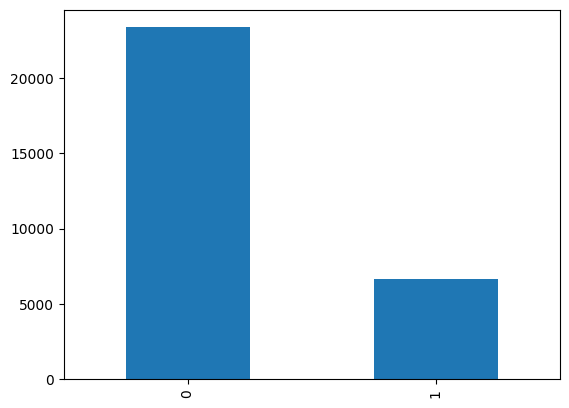

In [ ]:
df['default.payment.next.month'].value_counts().plot.bar()

In [ ]:
x=df.drop(['default.payment.next.month'],axis=1)
y=df['default.payment.next.month']

In [ ]:
from sklearn.preprocessing import MinMaxScaler

# fit scaler on training data
norm = MinMaxScaler().fit(x)

# transform training data
myarray = norm.transform(x)

In [ ]:
myarray

array([[0.00000000e+00, 1.00000000e+00, 1.00000000e+00, ...,
        0.00000000e+00, 0.00000000e+00, 0.00000000e+00],
       [3.33344445e-05, 1.09890110e-01, 1.00000000e+00, ...,
        1.61030596e-03, 0.00000000e+00, 3.78310691e-03],
       [6.66688890e-05, 4.39560440e-02, 1.00000000e+00, ...,
        1.61030596e-03, 2.34450647e-03, 9.45776729e-03],
       ...,
       [9.99933331e-01, 1.00000000e+00, 0.00000000e+00, ...,
        6.76328502e-03, 4.68901294e-03, 5.86381572e-03],
       [9.99966666e-01, 2.19780220e-02, 0.00000000e+00, ...,
        3.10144928e-03, 1.24174441e-01, 3.41236244e-03],
       [1.00000000e+00, 1.00000000e+00, 0.00000000e+00, ...,
        1.61030596e-03, 2.34450647e-03, 1.89155346e-03]])

In [ ]:
x.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6'],
      dtype='object')

In [ ]:
x=pd.DataFrame(myarray,columns=x.columns)

In [ ]:
x.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,...,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,0.000000,1.000000,1.0,0.333333,0.333333,0.051724,0.4,0.4,0.1,0.1,...,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000
1,0.000033,0.109890,1.0,0.333333,0.666667,0.086207,0.1,0.4,0.2,0.2,...,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783
2,0.000067,0.043956,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,...,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458
3,0.000100,1.000000,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,...,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892
4,0.000133,1.000000,0.0,0.333333,0.333333,0.620690,0.1,0.2,0.1,0.2,...,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284


In [ ]:
y

0        1
1        1
2        0
3        0
4        0
        ..
29995    0
29996    0
29997    1
29998    1
29999    1
Name: default.payment.next.month, Length: 30000, dtype: int64

In [ ]:
from imblearn.over_sampling import SMOTE
smot=SMOTE(sampling_strategy='minority')
x_smot,y_smot = smot.fit_resample(x,y)

In [ ]:
y_smot=pd.DataFrame(y_smot)
x_smot=pd.DataFrame(x_smot,columns=x.columns)

In [ ]:
x_smot.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6
0,0.000000,1.000000,1.0,0.333333,0.333333,0.051724,0.4,0.4,0.1,0.1,0.0,0.0,0.149982,0.069164,0.086723,0.160138,0.080648,0.260979,0.000000,0.000409,0.000000,0.000000,0.000000,0.000000
1,0.000033,0.109890,1.0,0.333333,0.666667,0.086207,0.1,0.4,0.2,0.2,0.2,0.4,0.148892,0.067858,0.087817,0.163220,0.084074,0.263485,0.000000,0.000594,0.001116,0.001610,0.000000,0.003783
2,0.000067,0.043956,1.0,0.333333,0.666667,0.224138,0.2,0.2,0.2,0.2,0.2,0.2,0.172392,0.079532,0.093789,0.173637,0.095470,0.272928,0.001738,0.000891,0.001116,0.001610,0.002345,0.009458
3,0.000100,1.000000,1.0,0.333333,0.333333,0.275862,0.2,0.2,0.2,0.2,0.2,0.2,0.188100,0.111995,0.113407,0.186809,0.109363,0.283685,0.002290,0.001199,0.001339,0.001771,0.002506,0.001892
4,0.000133,1.000000,0.0,0.333333,0.333333,0.620690,0.1,0.2,0.1,0.2,0.2,0.2,0.154144,0.071601,0.106020,0.179863,0.099633,0.275681,0.002290,0.021779,0.011160,0.014493,0.001615,0.001284


In [ ]:
y_smot.value_counts()

default.payment.next.month
0                             23364
1                             23364
dtype: int64

In [ ]:
# Feature selection
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
bestfeatures = SelectKBest(score_func = chi2,k=15)
features=bestfeatures.fit(x_smot,y_smot)
dfscores=pd.DataFrame(features.scores_)
dfcolumns=pd.DataFrame(x_smot.columns)
featureScores=pd.concat([dfcolumns,dfscores],axis=1)
featureScores.columns=['species','Score']
featureScores

,species,Score
0,ID,1.745360
1,LIMIT_BAL,47.244301
2,SEX,37.965707
3,EDUCATION,1.927951
4,MARRIAGE,2.670950
5,AGE,0.007579
6,PAY_0,388.085195
7,PAY_2,300.281890
8,PAY_3,247.688187
9,PAY_4,209.508925


In [ ]:
from sklearn.ensemble import ExtraTreesClassifier
import matplotlib.pyplot as plt
model = ExtraTreesClassifier()
model.fit(x_smot,y_smot)

<ipython-input-43-0799b8716503>:4: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model.fit(x_smot,y_smot)


ExtraTreesClassifier()

In [ ]:
model.feature_importances_

array([0.05577053, 0.05070703, 0.0127168 , 0.04522125, 0.02252161,
       0.0517785 , 0.11042471, 0.05165219, 0.04679829, 0.0375514 ,
       0.03445912, 0.03924863, 0.03900409, 0.03703967, 0.03604142,
       0.03552068, 0.03599291, 0.03615826, 0.03881308, 0.03702242,
       0.03607367, 0.03488818, 0.0357601 , 0.03883544])

<Axes: >

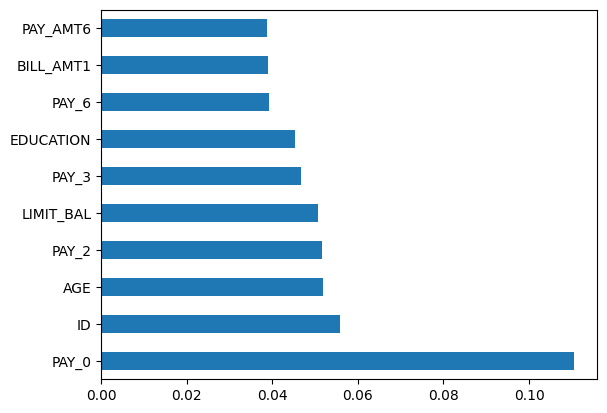

In [ ]:
feat_importances =  pd.Series(model.feature_importances_,index=x_smot.columns)
feat_importances.nlargest(10).plot(kind='barh')

In [ ]:
feat_importances.nlargest(10)

PAY_0        0.110425
ID           0.055771
AGE          0.051779
PAY_2        0.051652
LIMIT_BAL    0.050707
PAY_3        0.046798
EDUCATION    0.045221
PAY_6        0.039249
BILL_AMT1    0.039004
PAY_AMT6     0.038835
dtype: float64

In [ ]:
list=['PAY_0','PAY_2','ID','AGE','LIMIT_BAL','EDUCATION','PAY_3','PAY_4','BILL_AMT1','PAY_6']
x=x_smot[list]
x.head()

,PAY_0,PAY_2,ID,AGE,LIMIT_BAL,EDUCATION,PAY_3,PAY_4,BILL_AMT1,PAY_6
0,0.4,0.4,0.000000,0.051724,1.000000,0.333333,0.1,0.1,0.149982,0.0
1,0.1,0.4,0.000033,0.086207,0.109890,0.333333,0.2,0.2,0.148892,0.4
2,0.2,0.2,0.000067,0.224138,0.043956,0.333333,0.2,0.2,0.172392,0.2
3,0.2,0.2,0.000100,0.275862,1.000000,0.333333,0.2,0.2,0.188100,0.2
4,0.1,0.2,0.000133,0.620690,1.000000,0.333333,0.1,0.2,0.154144,0.2


In [ ]:
y=y_smot.copy()
y.head()

,default.payment.next.month
0,1
1,1
2,0
3,0
4,0


In [ ]:

from sklearn.model_selection import train_test_split
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.20)

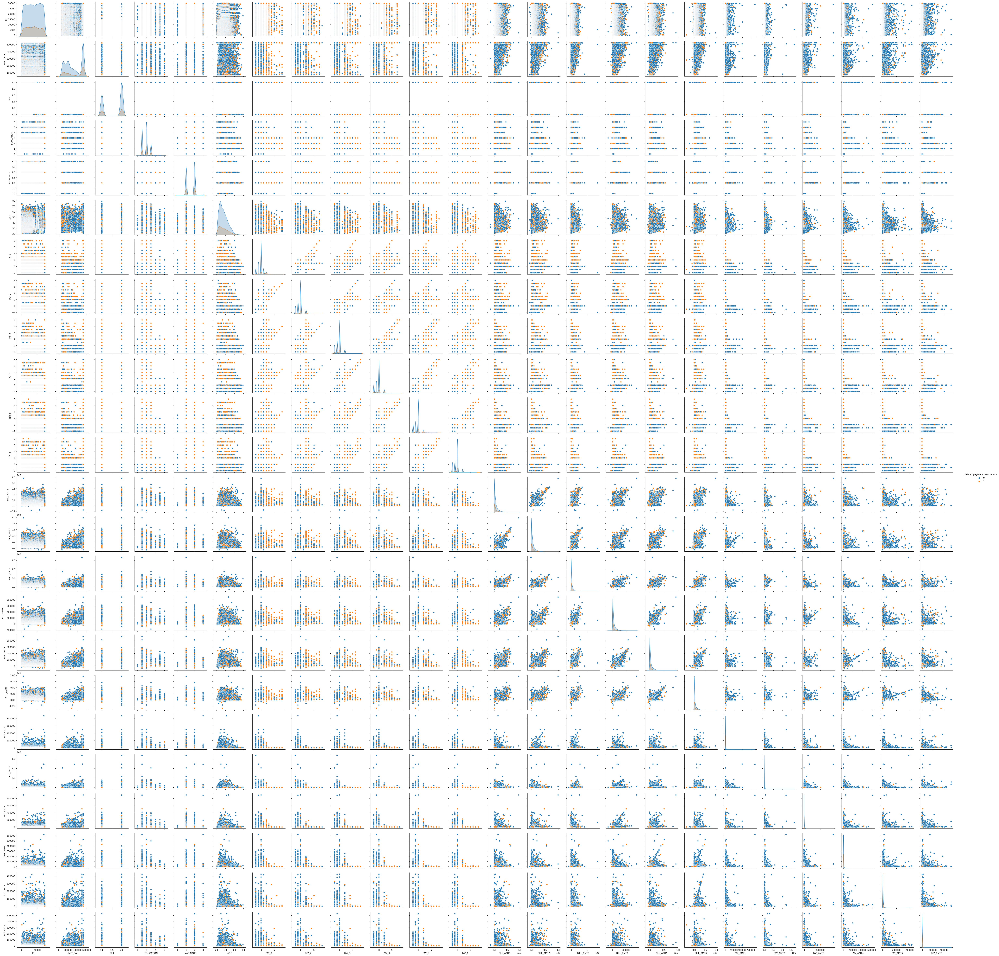

In [ ]:
import seaborn as sns
sns.pairplot(df,hue='default.payment.next.month')

In [ ]:
# There is much non linearity in classification of data
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

clf = DecisionTreeClassifier()
clf = clf.fit(x_train,y_train)
print("Using Decision Tree Prediction is " + str(clf.predict(x_test)))

neigh=KNeighborsClassifier()
neigh.fit(x_train, y_train)
print("Using K Neighbors Classifier Prediction is " + str(neigh.predict(x_test)))

rfor = RandomForestClassifier()
rfor.fit(x_train,y_train)
print("Using RandomForestClassifier Prediction is " + str(rfor.predict(x_test)) +"\n")

Using Decision Tree Prediction is [0 0 0 ... 0 0 0]


/usr/local/lib/python3.10/dist-packages/sklearn/neighbors/_classification.py:215: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Using K Neighbors Classifier Prediction is [0 0 0 ... 1 0 1]


<ipython-input-51-10d058f30dfb>:15: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  rfor.fit(x_train,y_train)


Using RandomForestClassifier Prediction is [0 0 0 ... 0 0 0]



In [ ]:
y_pred1=clf.predict(x_test)
y_pred2=neigh.predict(x_test)
y_pred3=rfor.predict(x_test)

In [ ]:
y_pred1.shape
y.shape

(46728, 1)

In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred1)

array([[3677, 1040],
       [ 997, 3632]])

In [ ]:
print("accuracy of Decision Tree Classifier" ,((4171+3821)/(4171+478+876+3821))*100 )

accuracy of Decision Tree Classifier 85.51251872458806


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred2)

array([[3284, 1433],
       [ 773, 3856]])

In [ ]:
print("accuracy of Knn" ,((3291+3899)/(3291+3899+798+1358))*100 )

accuracy of Knn 76.93130751123475


In [ ]:
from sklearn.metrics import confusion_matrix
confusion_matrix(y_test,y_pred3)

array([[4190,  527],
       [ 845, 3784]])

In [ ]:
print("accuracy of RandomForestClassifier" ,((4171+3821)/(4171+478+876+3821))*100 )

accuracy of RandomForestClassifier 85.51251872458806


In [ ]:
from sklearn.ensemble import VotingClassifier
model = VotingClassifier(estimators=[('DT', clf), ('knn', neigh),('rf',rfor)], voting='hard')
model.fit(x_train,y_train)
model.score(x_test,y_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:99: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_label.py:134: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, dtype=self.classes_.dtype, warn=True)


0.8381125615236464

In [ ]:
model.predict(x_test)

array([0, 0, 0, ..., 0, 0, 0])